# Proyek Klasifikasi Gambar: [boldcels_dataset]
- **Nama:** Mohammad Nurdin Prastya Hermansah
- **Email:** mohammadnurdin2001@gmail.com
- **ID Dicoding:** 2001nurdin

## **Import Semua Packages/Library yang Digunakan**

### Import Library

In [7]:
# Import libraries
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.applications.resnet50 import preprocess_input, ResNet50
import os
import pandas as pd
import numpy as np
import zipfile
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import ConfusionMatrixDisplay, classification_report

sns.set_theme(style="ticks")

## **Data Preparation**

### Dwonload Data

In [2]:
# upload token kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mohammadprastya23","key":"8d6dfc862cfa07ebdda3b4bc549efc2b"}'}

In [3]:
# Set Up Kaggle Credentials
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
# dwonload data
!kaggle datasets download -d unclesamulus/blood-cells-image-dataset

# unzip data
!unzip blood-cells-image-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: bloodcells_dataset/neutrophil/BNE_448273.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_44875.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_448776.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_449730.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_449915.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_450464.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_451701.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_451729.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_453088.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_454089.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_454943.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_455080.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_4555.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_455636.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_45575.jpg  
  inflating: bloodcells_dataset/neutrophil/BNE_456543

### Data Preprocessing

#### Data Loading

In [5]:
import os

# Lokasi folder dataset
folder_path = '/content/bloodcells_dataset/'

# List kelas = subfolder
kelas_list = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]
kelas_list.sort()  # Biar rapi urut abjad

# Hitung jumlah file per kelas
jumlah_data = []

for kelas in kelas_list:
    kelas_path = os.path.join(folder_path, kelas)
    total_file = len([
        f for f in os.listdir(kelas_path)
        if os.path.isfile(os.path.join(kelas_path, f)) and f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])
    jumlah_data.append({'kelas': kelas, 'jumlah': total_file})

# Ubah ke DataFrame
df = pd.DataFrame(jumlah_data)
print(df)

          kelas  jumlah
0      basophil    1218
1    eosinophil    3117
2  erythroblast    1551
3            ig    2895
4    lymphocyte    1214
5      monocyte    1420
6    neutrophil    3329
7      platelet    2348


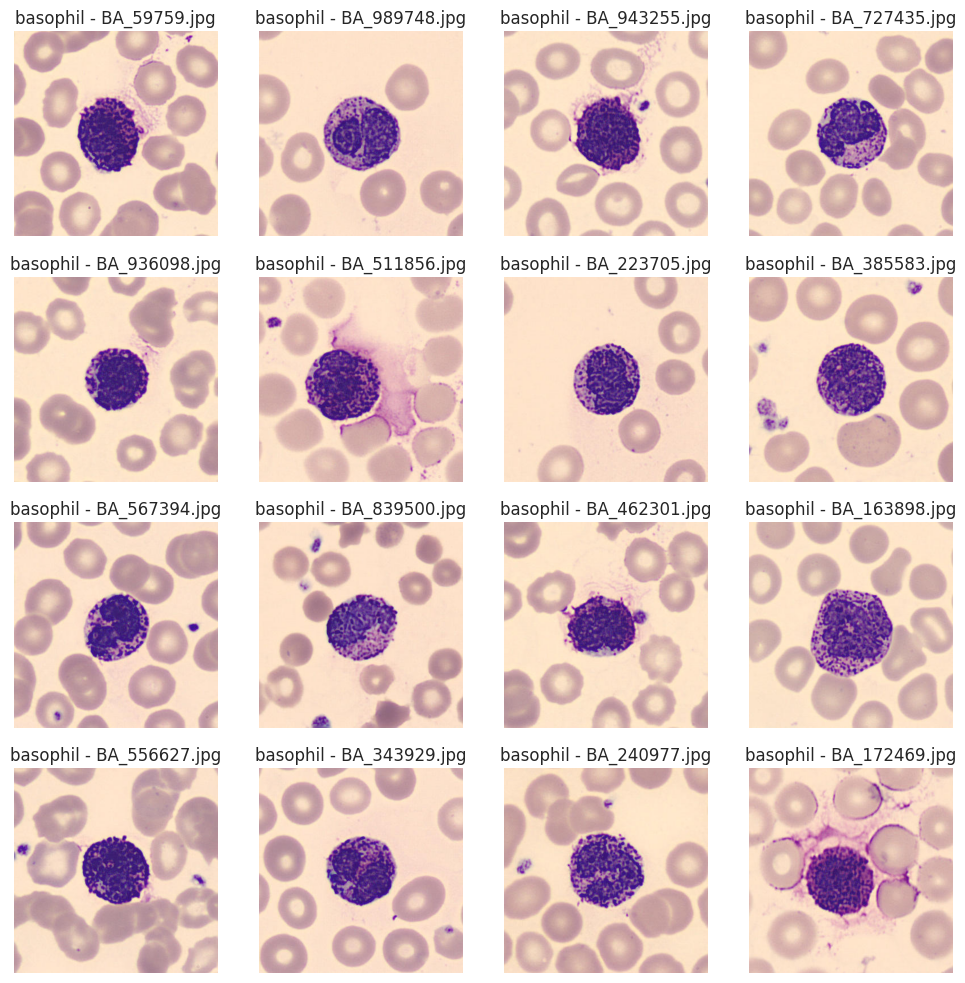

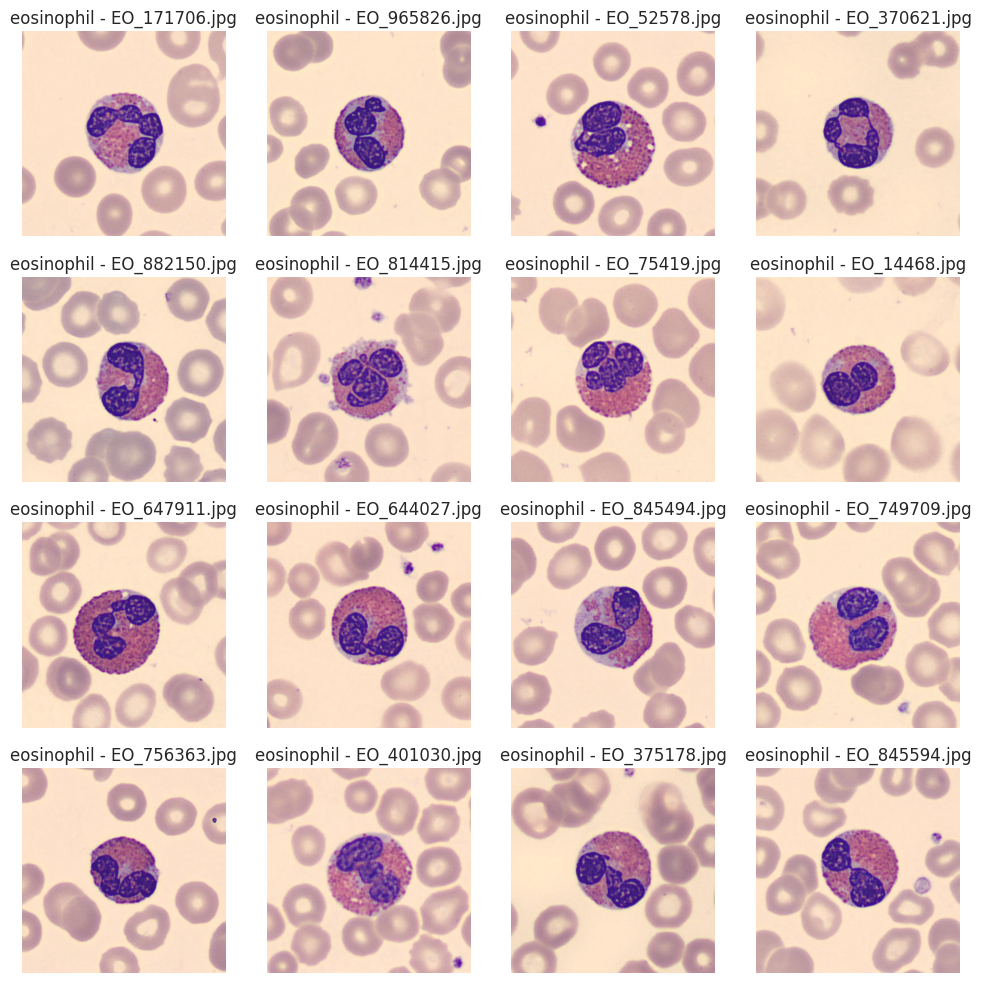

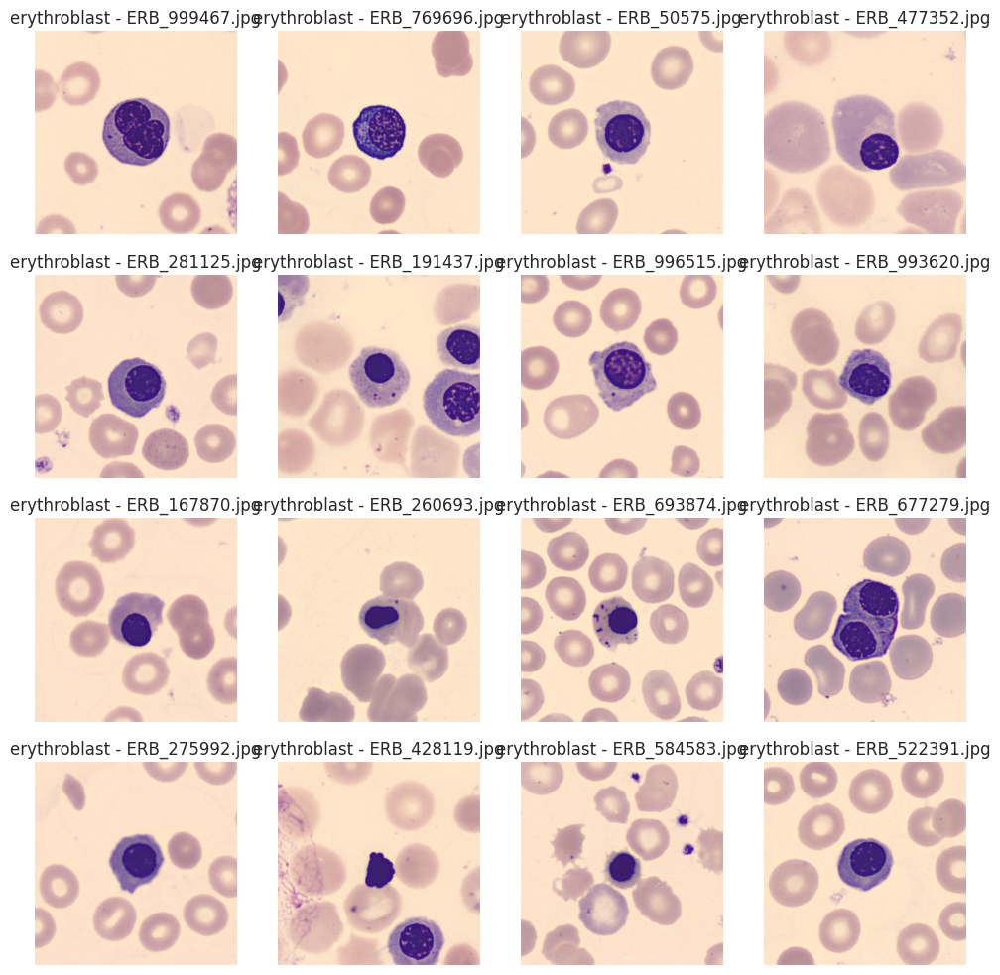

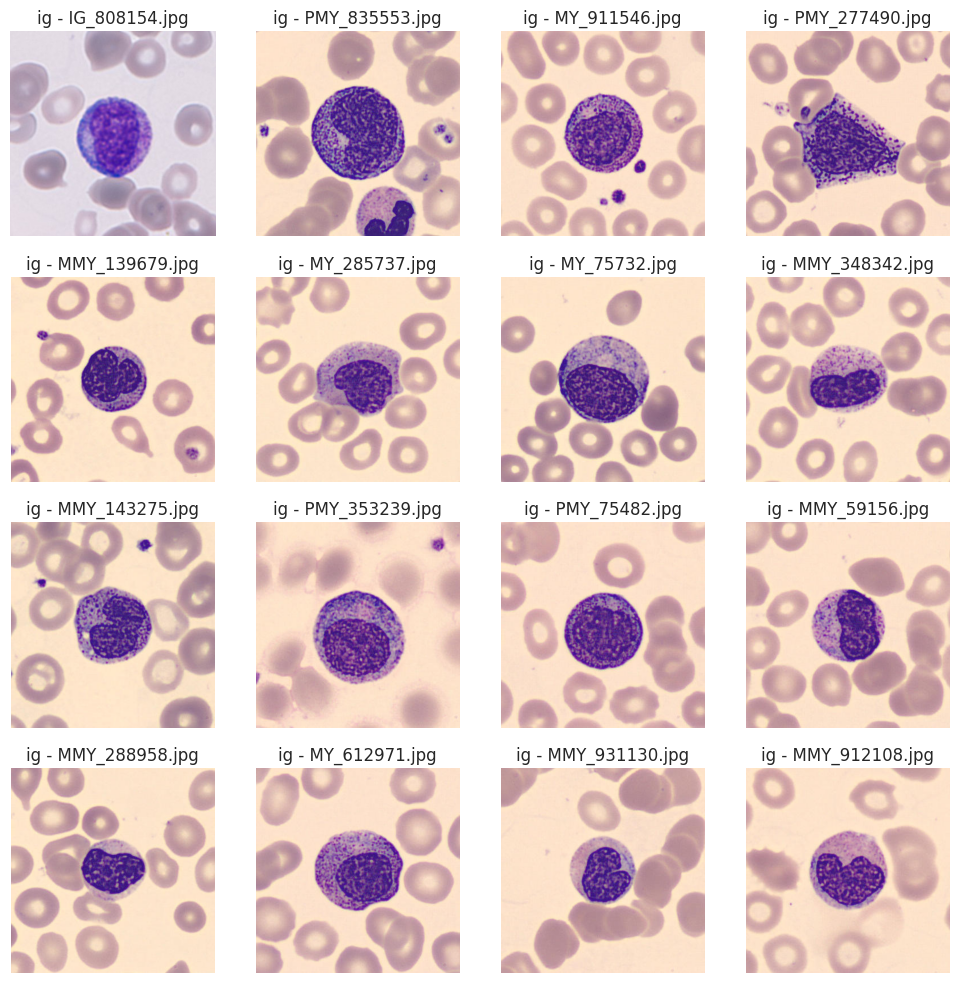

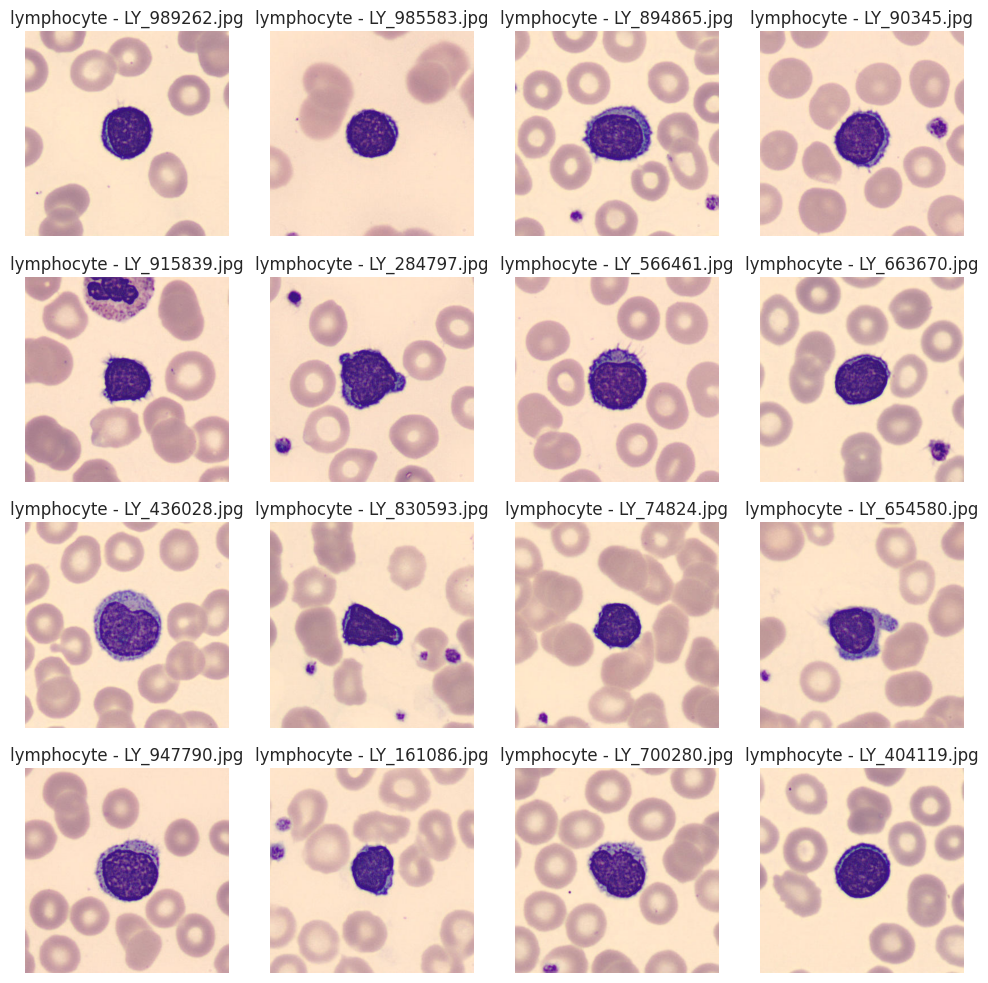

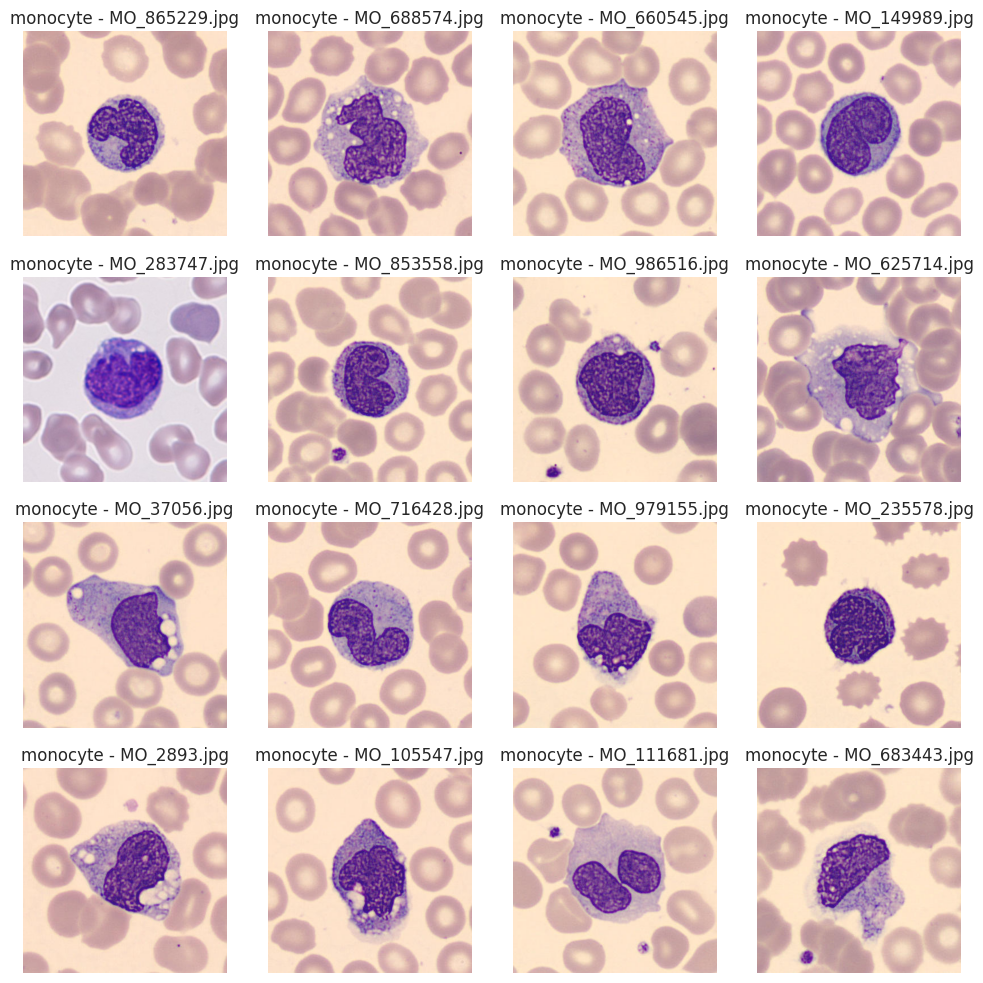

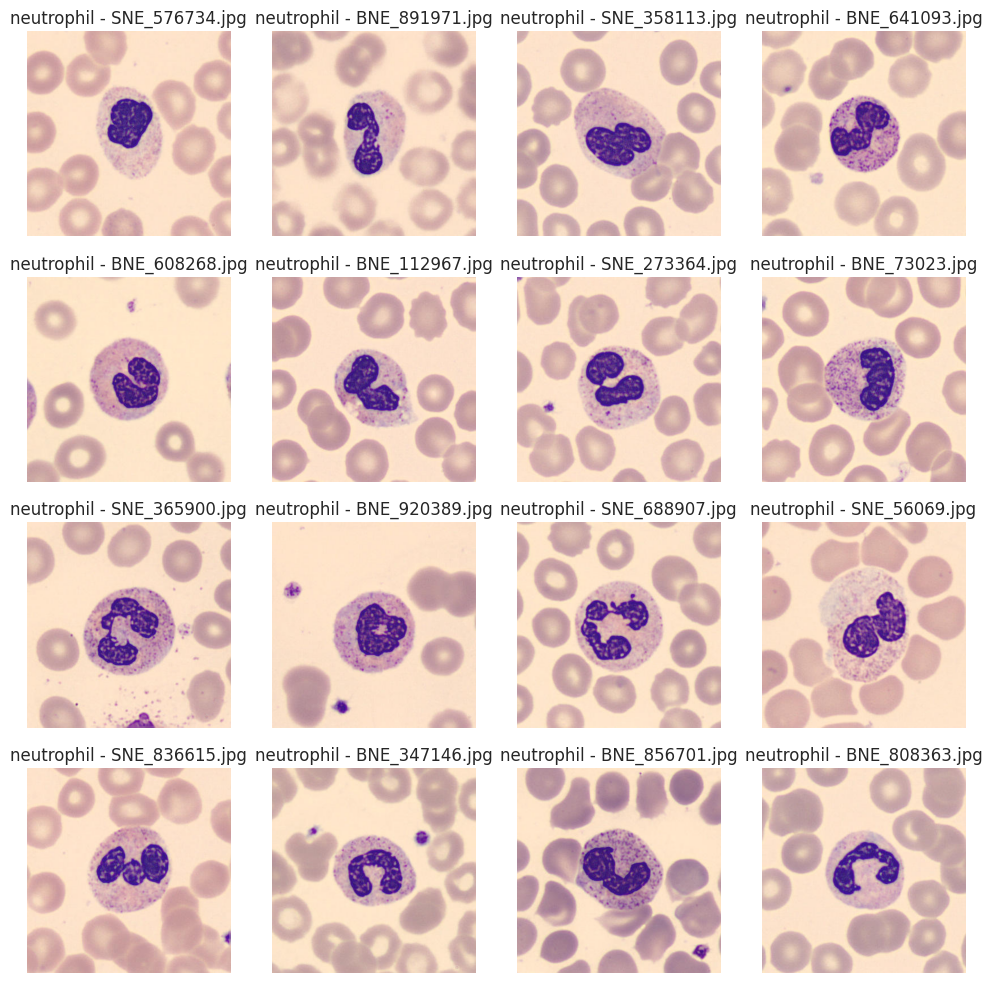

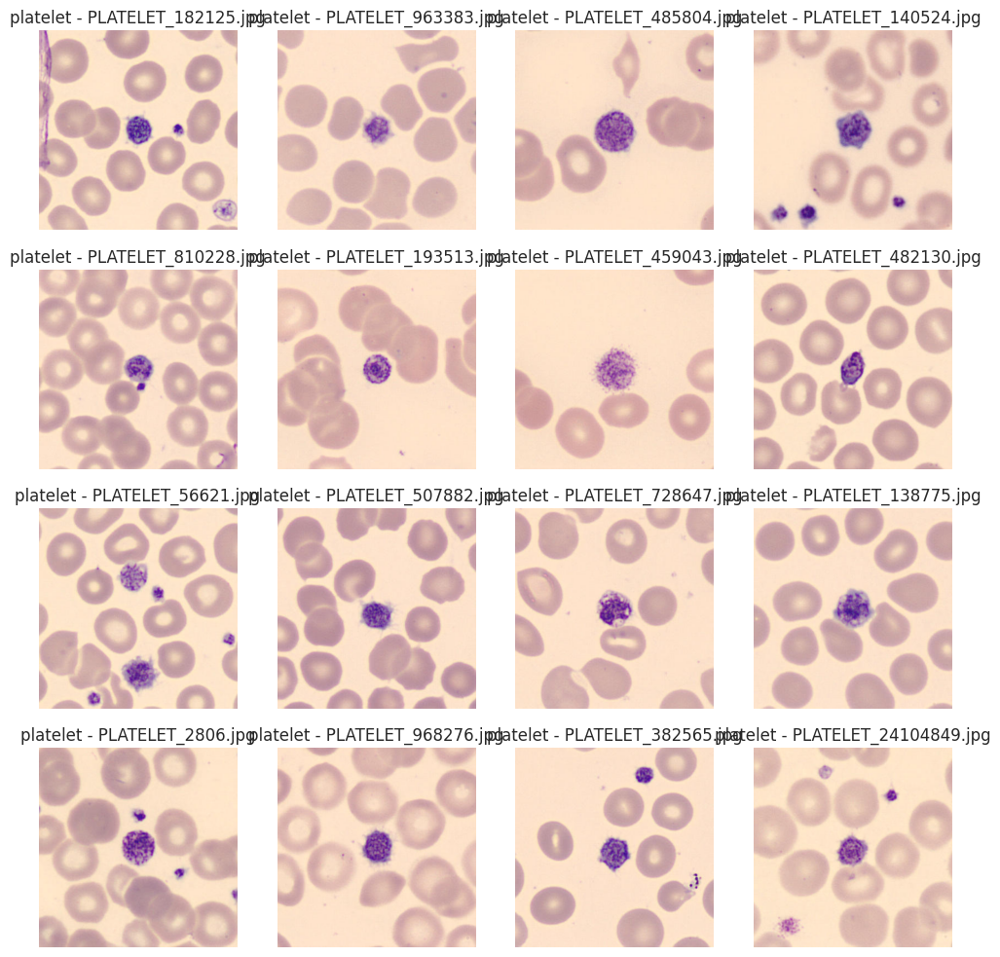

In [6]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Lokasi folder dataset
folder_path = '/content/bloodcells_dataset/'

# List kelas = subfolder
kelas_list = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]
kelas_list.sort()  # Biar rapi urut abjad

# Fungsi untuk menampilkan gambar
def tampilkan_gambar(kelas, folder_path, n=16):
    kelas_path = os.path.join(folder_path, kelas)
    gambar_list = [
        f for f in os.listdir(kelas_path)
        if os.path.isfile(os.path.join(kelas_path, f)) and f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]

    # Pilih n gambar secara acak
    random_images = random.sample(gambar_list, min(n, len(gambar_list)))

    fig, axes = plt.subplots(4, 4, figsize=(10, 10))
    axes = axes.flatten()

    for i, img_name in enumerate(random_images):
        img_path = os.path.join(kelas_path, img_name)
        img = mpimg.imread(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f'{kelas} - {img_name}')

    plt.tight_layout()
    plt.show()

# Menampilkan 16 gambar dari masing-masing kelas
for kelas in kelas_list:
    tampilkan_gambar(kelas, folder_path, n=16)

#### EDA

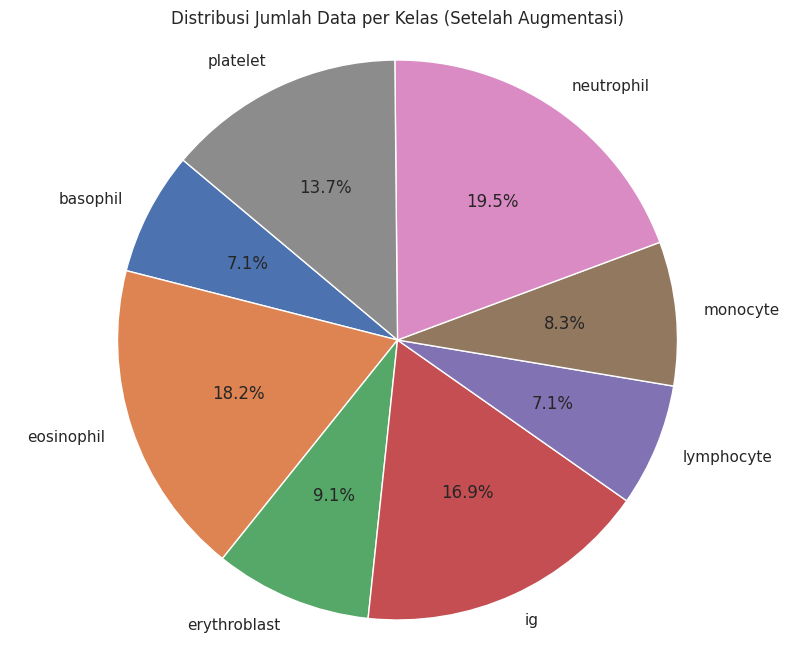

In [7]:
import matplotlib.pyplot as plt

# Pie Chart
plt.figure(figsize=(10, 8))
plt.pie(df['jumlah'], labels=df['kelas'], autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Distribusi Jumlah Data per Kelas (Setelah Augmentasi)')
plt.show()

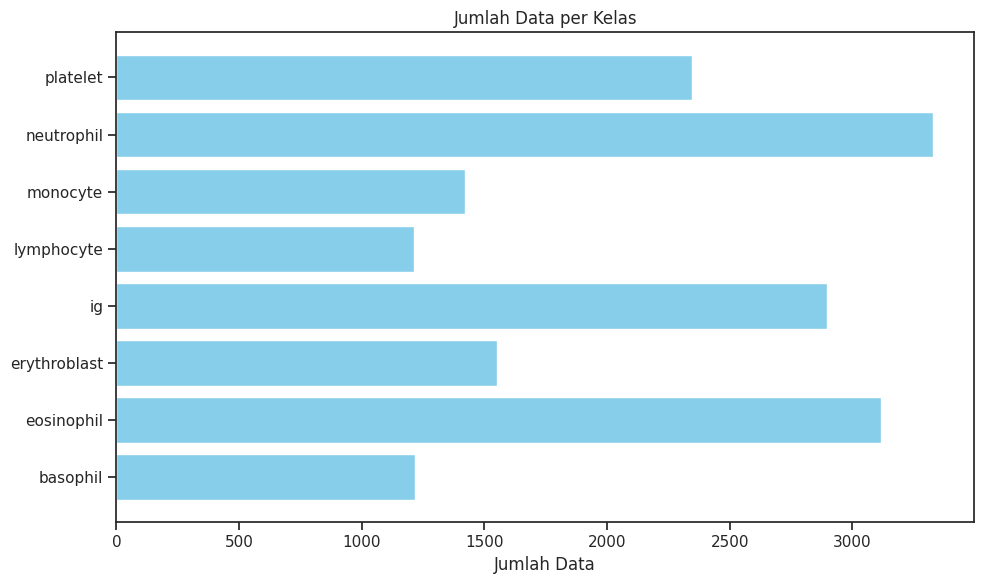

In [8]:
# Bar chart
plt.figure(figsize=(10, 6))
plt.barh(df['kelas'], df['jumlah'], color='skyblue')
plt.xlabel("Jumlah Data")
plt.title("Jumlah Data per Kelas")
plt.tight_layout()
plt.show()

### Split Dataset

Data dibagi menjadi tiga bagian utama:
- 64% untuk data pelatihan (training set)

- 16% untuk data validasi (validation set)

- 20% untuk data pengujian (test set)

In [9]:
# Import and prepare the first split of datasets
path = os.path.join("/content/bloodcells_dataset/")

BATCH_SIZE = 32
IMG_HEIGHT = 224
IMG_WIDTH = 224
dataset, test_dataset = keras.utils.image_dataset_from_directory(directory=path,
                                                                 image_size=(IMG_WIDTH, IMG_HEIGHT),
                                                                 batch_size=BATCH_SIZE,
                                                                 label_mode="int",
                                                                 validation_split=0.2,
                                                                 subset="both",
                                                                 shuffle=True,
                                                                 seed=42)

# Get class names
class_names = dataset.class_names
print(class_names)

Found 17092 files belonging to 8 classes.
Using 13674 files for training.
Using 3418 files for validation.
['basophil', 'eosinophil', 'erythroblast', 'ig', 'lymphocyte', 'monocyte', 'neutrophil', 'platelet']


In [10]:
# Split dataset in train and validation set
num_elements = len(dataset)
train_size = int(0.8 * num_elements)
val_dataset = dataset.skip(train_size).prefetch(tf.data.AUTOTUNE)
train_dataset = dataset.take(train_size).prefetch(tf.data.AUTOTUNE)

# Check length
len(train_dataset), len(val_dataset), len(test_dataset)

(342, 86, 107)

In [11]:
# Check format
for image_batch, labels_batch in train_dataset.take(1):
  print(f"Train data: {image_batch.shape}")
  print(f"Train labels: {labels_batch.shape}")

for image_batch, labels_batch in val_dataset.take(1):
  print(f"Validation data: {image_batch.shape}")
  print(f"Validation labels: {labels_batch.shape}")

for image_batch, labels_batch in test_dataset.take(1):
  print(f"Test data: {image_batch.shape}")
  print(f"Test labels: {labels_batch.shape}")

Train data: (32, 224, 224, 3)
Train labels: (32,)
Validation data: (32, 224, 224, 3)
Validation labels: (32,)
Test data: (32, 224, 224, 3)
Test labels: (32,)


In [12]:
# Check pixel intesities
for image, label in train_dataset.take(1):
  print(tf.reduce_max(image))
  print(tf.reduce_min(image))

tf.Tensor(255.0, shape=(), dtype=float32)
tf.Tensor(3.2101154, shape=(), dtype=float32)


### Data Augmentation

In [13]:
# Set up data augmentation layers
data_augmentation = keras.Sequential([
    keras.layers.RandomFlip("horizontal_and_vertical"),
    keras.layers.RandomRotation(0.4)
    ])

## **Modelling**

### *Callback*

In [26]:
# Create a lab-book to track the different experiments
lab_book = {}

# Create early stopping callback
early_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True,
                                         monitor="val_accuracy", min_delta=0.005)

### **Model 1 simpel CNN**


In [28]:
# Lab book name entry
name = "Model_1"

# Build model
tf.random.set_seed(42)
model_1 = keras.Sequential([
    layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    layers.Rescaling(1./255),
    data_augmentation,
    layers.Conv2D(filters=8, kernel_size=(3,3),
                  padding="same", activation="relu",
                  kernel_initializer="he_normal"),
    layers.MaxPool2D(),
    layers.Flatten(),
    layers.Dense(8, activation="softmax")
    ], name=name)

model_1.summary()

# Compile model
model_1.compile(loss=keras.losses.SparseCategoricalCrossentropy(),
                optimizer=keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit model
history_1 = model_1.fit(train_dataset,
                        validation_data=val_dataset,
                        epochs=100,
                        callbacks=[early_cb])

# Write lab-book
train_accuracy = model_1.evaluate(train_dataset)[1]
val_accuracy = model_1.evaluate(val_dataset)[1]
lab_book[name] = {"train_accuracy": train_accuracy, "val_accuracy": val_accuracy}

Model: "Model_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 8)    │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 112, 112, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │       802,824 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 803,048 (3.06 MB)

 Trainable params: 803,048 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - accuracy: 0.3706 - loss: 10.8723 - val_accuracy: 0.6766 - val_loss: 0.9068
Epoch 2/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.6785 - loss: 0.9230 - val_accuracy: 0.7703 - val_loss: 0.6450
Epoch 3/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - accuracy: 0.7966 - loss: 0.5746 - val_accuracy: 0.7758 - val_loss: 0.6367
Epoch 4/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8185 - loss: 0.5261 - val_accuracy: 0.8403 - val_loss: 0.4967
Epoch 5/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8443 - loss: 0.4488 - val_accuracy: 0.8538 - val_loss: 0.4154
Epoch 6/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8606 - loss: 0.4191 - val_accuracy: 0.8355 - val_loss: 0.4946
Epoch 7/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - accuracy: 0.8619 - loss: 0.4043 - val_accuracy: 0.8575 - val_loss: 0.4243
Epoch 8/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8644 - loss:

In [29]:
# Simpan seluruh model (struktur + bobot)
model_1.save('model_1_cnn.h5')

model_1.save('model_1_cnn.keras')

In [33]:
# Simpan ke file .pkl
import pickle

with open('cnn_history1.pkl', 'wb') as f:
    pickle.dump(history_1.history, f)

### **Model 2 complex CNN**

In [48]:
# Lab book name entry
name = "Model_2"

# Build model
tf.random.set_seed(42)
model_2 = keras.Sequential([
    layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    layers.Rescaling(1./255),
    data_augmentation,
    layers.Conv2D(filters=8, kernel_size=(5,5),
                  padding="same", activation="relu",
                  kernel_initializer="he_normal"),
    layers.MaxPool2D(),
    layers.Conv2D(filters=16, kernel_size=(3,3),
                  padding="same", activation="relu",
                  kernel_initializer="he_normal"),
    layers.MaxPool2D(),
    layers.Conv2D(filters=32, kernel_size=(3,3),
                  padding="same", activation="relu",
                  kernel_initializer="he_normal"),
    layers.MaxPool2D(),
    layers.Flatten(),
    layers.Dense(8, activation="softmax")
    ], name=name)

model_2.summary()

# Compile model
model_2.compile(loss=keras.losses.SparseCategoricalCrossentropy(),
                optimizer=keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit model
history_2 = model_2.fit(train_dataset,
                        validation_data=val_dataset,
                        epochs=100,
                        callbacks=[early_cb])

# Write lab-book
train_accuracy = model_2.evaluate(train_dataset)[1]
val_accuracy = model_2.evaluate(val_dataset)[1]
lab_book[name] = {"train_accuracy": train_accuracy, "val_accuracy": val_accuracy}

Model: "Model_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 224, 224, 8)    │           608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 112, 112, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │       200,712 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 207,128 (809.09 KB)

 Trainable params: 207,128 (809.09 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - accuracy: 0.5551 - loss: 1.4258 - val_accuracy: 0.8359 - val_loss: 0.4851
Epoch 2/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - accuracy: 0.8540 - loss: 0.4238 - val_accuracy: 0.8802 - val_loss: 0.3595
Epoch 3/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 31s 89ms/step - accuracy: 0.8878 - loss: 0.3445 - val_accuracy: 0.8813 - val_loss: 0.3458
Epoch 4/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8930 - loss: 0.3124 - val_accuracy: 0.8670 - val_loss: 0.3901
Epoch 5/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - accuracy: 0.9099 - loss: 0.2735 - val_accuracy: 0.9070 - val_loss: 0.2847
Epoch 6/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - accuracy: 0.9177 - loss: 0.2447 - val_accuracy: 0.9114 - val_loss: 0.2468
Epoch 7/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - accuracy: 0.9245 - loss: 0.2386 - val_accuracy: 0.9201 - val_loss: 0.2375
Epoch 8/100
342/342 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - accuracy: 0.9337 - loss:

In [49]:
# Simpan seluruh model (struktur + bobot)
model_2.save('model_2_cnn.h5')

model_2.save('model_2_cnn.keras')

In [50]:
# Simpan ke file .pkl
import pickle

with open('cnn_history2.pkl', 'wb') as f:
    pickle.dump(history_2.history, f)

## **Visualisasi Hasil Prediksi**

### Visualisasi Data Testing model 1

In [92]:
# Prediksi pada data testing
y_pred = model_1.predict(test_dataset)
y_pred_classes = np.argmax(y_pred, axis=1)

# Ambil daftar unik kelas yang berhasil diprediksi
unique_classes = np.unique(y_pred_classes)

# Mapping index ke nama kelas
class_names1 = test_dataset.class_names  # Misal: ['basophil', 'eosinophil', ...]

# Buat DataFrame hasilnya
import pandas as pd

df_hasil = pd.DataFrame({
    "Index Kelas": unique_classes,
    "Nama Kelas": [class_names[i] for i in unique_classes]
})

# Tampilkan
print(f"Jumlah kelas yang berhasil diprediksi: {len(unique_classes)}")
print(df_hasil)

107/107 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step
Jumlah kelas yang berhasil diprediksi: 8
   Index Kelas    Nama Kelas
0            0      basophil
1            1    eosinophil
2            2  erythroblast
3            3            ig
4            4    lymphocyte
5            5      monocyte
6            6    neutrophil
7            7      platelet


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


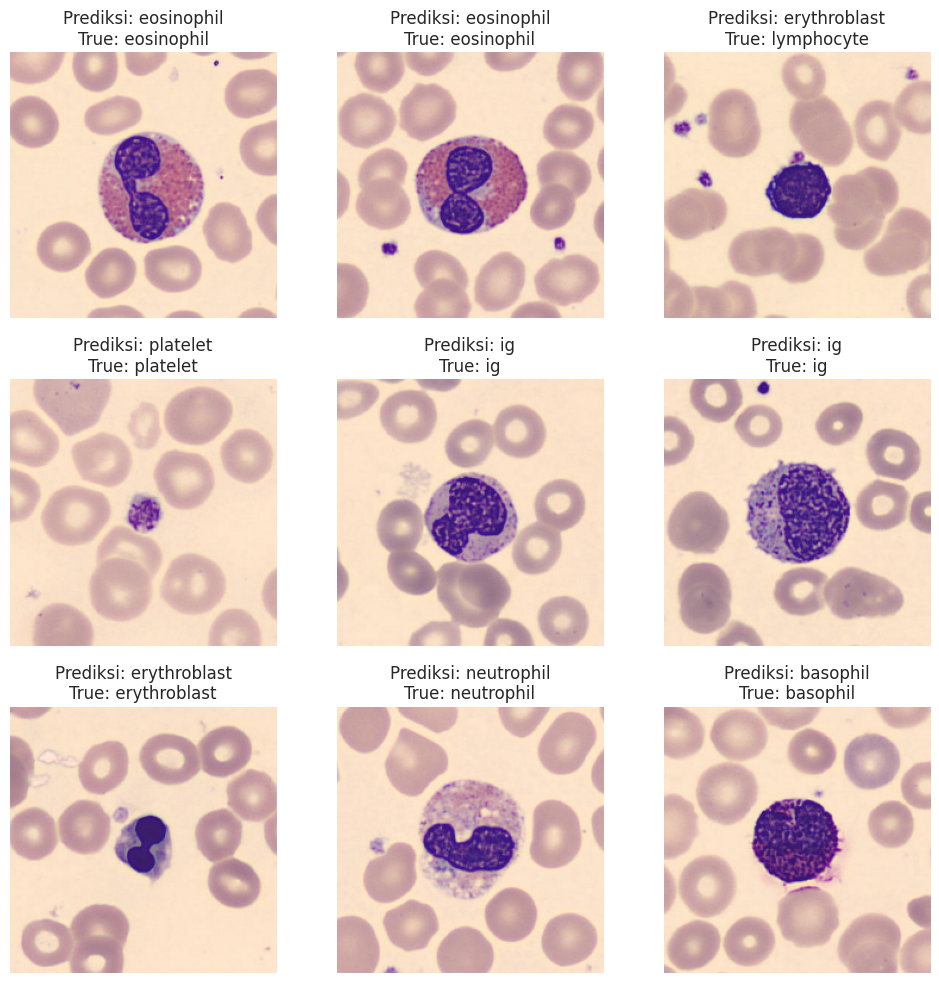

In [94]:
import numpy as np
import matplotlib.pyplot as plt

# Ambil nama kelas dari dataset
class_names = test_dataset.class_names

# Ambil batch dari test_dataset
for images, labels in test_dataset.take(1):  # ambil 1 batch
    preds = model_1.predict(images)
    pred_labels = np.argmax(preds, axis=1)

    # Tampilkan 9 gambar beserta label prediksi dan aslinya
    plt.figure(figsize=(10,10))
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Prediksi: {class_names[pred_labels[i]]}\nTrue: {class_names[labels[i]]}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

### Visualisasi Data Testing model 2

In [85]:
# Prediksi pada data testing
y_pred = model_2.predict(test_dataset)
y_pred_classes = np.argmax(y_pred, axis=1)

# Ambil daftar unik kelas yang berhasil diprediksi
unique_classes = np.unique(y_pred_classes)

# Mapping index ke nama kelas
class_names2 = test_dataset.class_names

# Buat DataFrame hasilnya
import pandas as pd

df_hasil = pd.DataFrame({
    "Index Kelas": unique_classes,
    "Nama Kelas": [class_names[i] for i in unique_classes]
})

# Tampilkan
print(f"Jumlah kelas yang berhasil diprediksi: {len(unique_classes)}")
print(df_hasil)

107/107 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step
Jumlah kelas yang berhasil diprediksi: 8
   Index Kelas    Nama Kelas
0            0      basophil
1            1    eosinophil
2            2  erythroblast
3            3            ig
4            4    lymphocyte
5            5      monocyte
6            6    neutrophil
7            7      platelet


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step


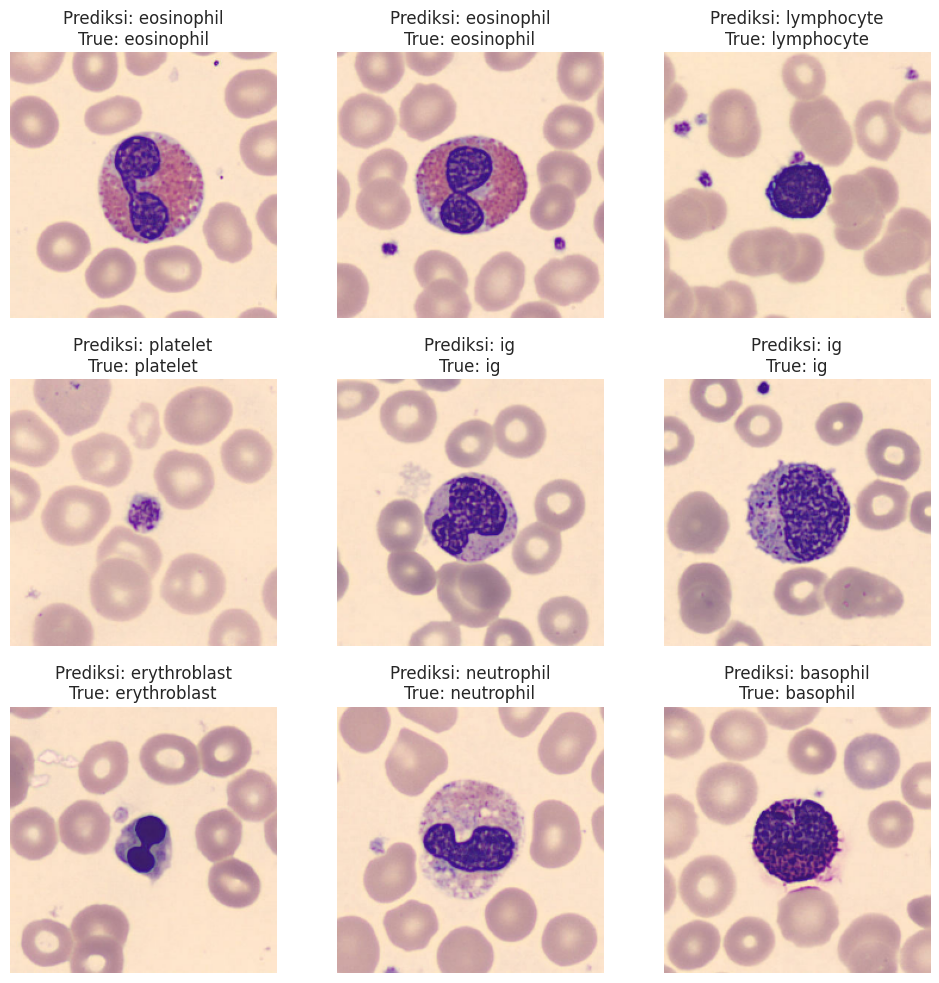

In [91]:
import numpy as np
import matplotlib.pyplot as plt

# Ambil nama kelas dari dataset
class_names = test_dataset.class_names

# Ambil batch dari test_dataset
for images, labels in test_dataset.take(1):  # ambil 1 batch
    preds = model_2.predict(images)
    pred_labels = np.argmax(preds, axis=1)

    # Tampilkan 9 gambar beserta label prediksi dan aslinya
    plt.figure(figsize=(10,10))
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Prediksi: {class_names[pred_labels[i]]}\nTrue: {class_names[labels[i]]}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

## **Evaluasi Model**

### Evaluasi dan Testing model 1

In [14]:
from tensorflow.keras.models import load_model
# Load model dari file .h5
model_1 = load_model("model_1_cnn.h5")

In [34]:
import pickle

with open('cnn_history1.pkl', 'rb') as f:
    history = pickle.load(f)

In [31]:
# Check test set accuracy of model 5 since base model will be changed afterwards
# Inisialisasi dictionary untuk menyimpan skor
test_scores = {}
train_scores = {}

# Evaluasi model pada data training dan testing
train_accuracy = model_1.evaluate(train_dataset, verbose=0)[1]
test_accuracy = model_1.evaluate(test_dataset, verbose=0)[1]

# Simpan hasil ke dictionary dengan label yang sesuai
train_scores["Model_1"] = train_accuracy
test_scores["Model_1"] = test_accuracy

# Tampilkan hasil
print(f"Akurasi Model 1 pada data training: {train_accuracy:.2f}")
print(f"Akurasi Model 1 pada data testing: {test_accuracy:.2f}")

Akurasi Model 1 pada data training: 0.89
Akurasi Model 1 pada data testing: 0.88


#### Akurasi dan Loss

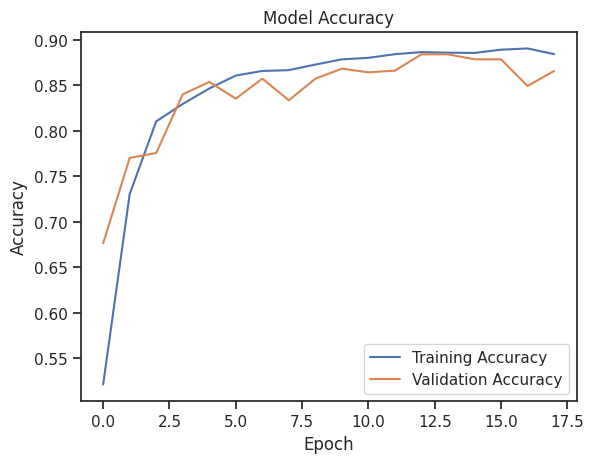

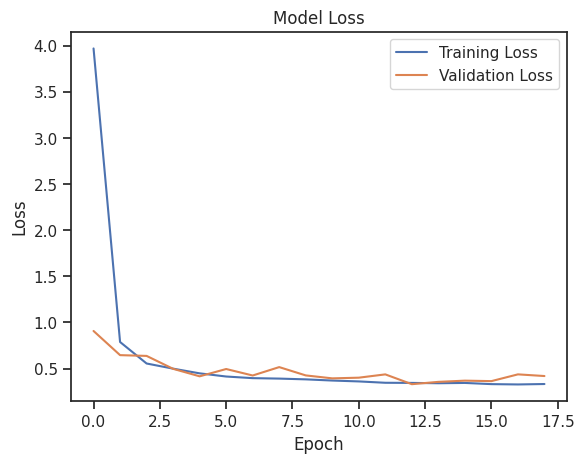

In [35]:
import matplotlib.pyplot as plt

# Plot akurasi
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot loss
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

#### Confusion Matrix

107/107 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step


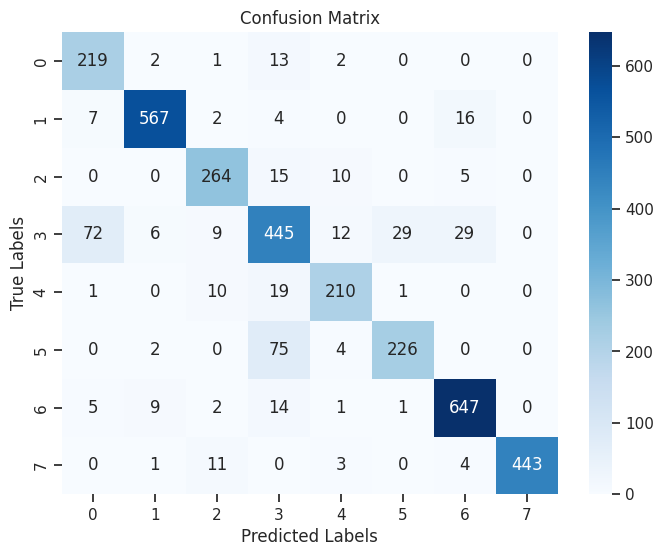


Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.92      0.81       237
           1       0.97      0.95      0.96       596
           2       0.88      0.90      0.89       294
           3       0.76      0.74      0.75       602
           4       0.87      0.87      0.87       241
           5       0.88      0.74      0.80       307
           6       0.92      0.95      0.94       679
           7       1.00      0.96      0.98       462

    accuracy                           0.88      3418
   macro avg       0.88      0.88      0.87      3418
weighted avg       0.89      0.88      0.88      3418



In [37]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# 1. Prediksi data test
y_pred_probs = model_1.predict(test_dataset)
y_pred = np.argmax(y_pred_probs, axis=1)  # ambil kelas dengan skor tertinggi

# 2. Ambil label asli dari test_dataset
# Jika test_dataset dibuat dari tf.data, kamu bisa ambil semua label seperti ini:
y_true = []
for _, labels in test_dataset:
    y_true.extend(labels.numpy())  # tanpa argmax karena bukan one-hot
y_true = np.array(y_true)

# 3. Buat confusion matrix
cm = confusion_matrix(y_true, y_pred)

# 4. Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# (Opsional) Tampilkan classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred))

### Evaluasi dan testing model 2

In [1]:
from tensorflow.keras.models import load_model
# Load model dari file .h5
model_2 = load_model("model_2_cnn.h5")

In [2]:
import pickle

with open('cnn_history2.pkl', 'rb') as f:
    history_2 = pickle.load(f)

In [54]:
# Check test set accuracy of model 5 since base model will be changed afterwards
# Inisialisasi dictionary untuk menyimpan skor
test_scores = {}
train_scores = {}

# Evaluasi model pada data training dan testing
train_accuracy = model_2.evaluate(train_dataset, verbose=0)[1]
test_accuracy = model_2.evaluate(test_dataset, verbose=0)[1]

# Simpan hasil ke dictionary dengan label yang sesuai
train_scores["Model_2"] = train_accuracy
test_scores["Model_2"] = test_accuracy

# Tampilkan hasil
print(f"Akurasi Model 2 pada data training: {train_accuracy:.2f}")
print(f"Akurasi Model 2 pada data testing: {test_accuracy:.2f}")

Akurasi Model 2 pada data training: 0.95
Akurasi Model 2 pada data testing: 0.95


#### Akurasi dan Loss

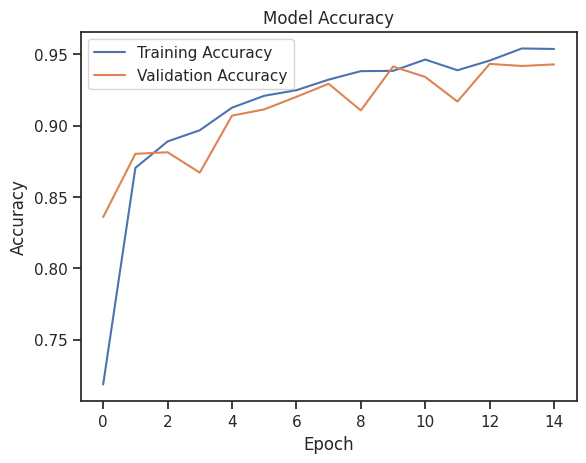

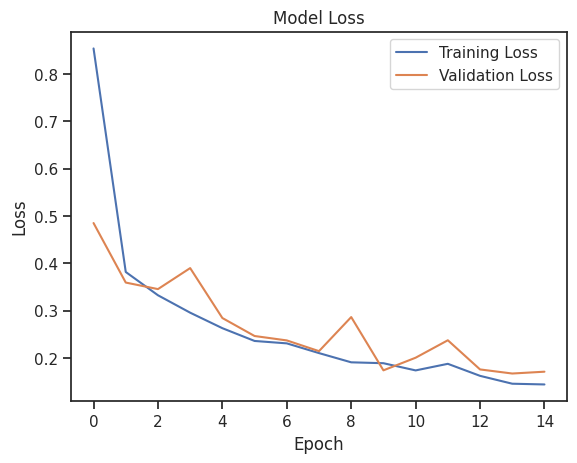

In [56]:
import matplotlib.pyplot as plt

# Plot akurasi
plt.plot(history_2['accuracy'], label='Training Accuracy')
plt.plot(history_2['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot loss
plt.plot(history_2['loss'], label='Training Loss')
plt.plot(history_2['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

#### Confusion Matrix

107/107 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step


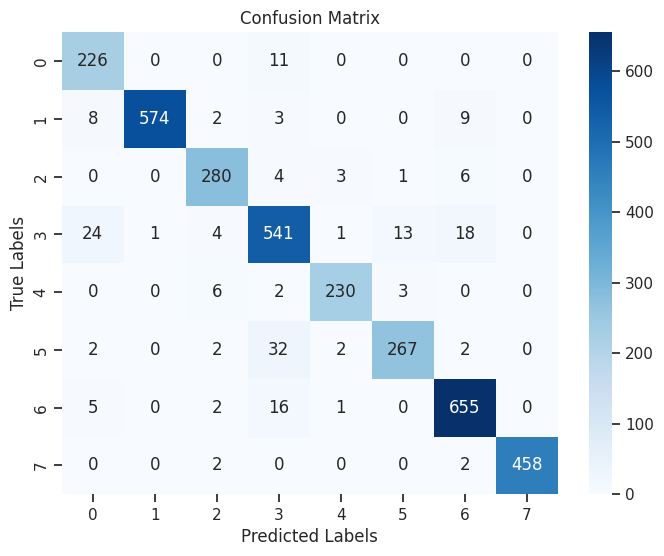


Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       237
           1       1.00      0.96      0.98       596
           2       0.94      0.95      0.95       294
           3       0.89      0.90      0.89       602
           4       0.97      0.95      0.96       241
           5       0.94      0.87      0.90       307
           6       0.95      0.96      0.96       679
           7       1.00      0.99      1.00       462

    accuracy                           0.95      3418
   macro avg       0.94      0.94      0.94      3418
weighted avg       0.95      0.95      0.95      3418



In [57]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# 1. Prediksi data test
y_pred_probs = model_2.predict(test_dataset)
y_pred = np.argmax(y_pred_probs, axis=1)  # ambil kelas dengan skor tertinggi

# 2. Ambil label asli dari test_dataset
# Jika test_dataset dibuat dari tf.data, kamu bisa ambil semua label seperti ini:
y_true = []
for _, labels in test_dataset:
    y_true.extend(labels.numpy())  # tanpa argmax karena bukan one-hot
y_true = np.array(y_true)

# 3. Buat confusion matrix
cm = confusion_matrix(y_true, y_pred)

# 4. Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# (Opsional) Tampilkan classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred))

## **Konversi Model**

Berdasarkan evaluasi model 1 dan 2 memeiliki skor yang berbeda dimana model 2 lebih bagus yaitu akurasi di training dan testing sebesar 0.95 maka pada tahap konversi model ini, hanya model 2 yang akan di konversi ke beberapa model.

### Konversi Model 2

#### SavedModel Format (standar TensorFlow)

In [4]:
import shutil
from IPython.display import FileLink

In [5]:
# SavedModel Format (standar TensorFlow)
model_2.export("saved_model/Model_2")

# Kompres folder jadi zip
shutil.make_archive("Model_2_saved", 'zip', "saved_model/Model_2")

Saved artifact at 'saved_model/Model_2'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_3')
Output Type:
  TensorSpec(shape=(None, 8), dtype=tf.float32, name=None)
Captures:
  135039512731024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039512734480: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039512736592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039512739088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039512739664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039512738896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039512736784: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039512739280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039497011472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135039497013200: TensorSpec(shape=(), dtype=tf.resource, name=None)


'/content/Model_2_saved.zip'

#### Konversi ke TFLite (buat mobile & embedded)

In [42]:
converter = tf.lite.TFLiteConverter.from_saved_model("saved_model/Model_2")

# Opsi opsional jika konversi biasa gagal
converter.allow_custom_ops = True  # Kalau ada layer yang tidak standar
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Untuk kompresi model

# Konversi model
tflite_model = converter.convert()

In [9]:
with open("model_2.tflite", "wb") as f:
    f.write(tflite_model)

In [43]:
labels = [
    "basophil",
    "eosinophil",
    "erythroblast",
    "ig",
    "lymphocyte",
    "monocyte",
    "neutrophil",
    "platelet"
]

with open("labels.txt", "w") as f:
    for label in labels:
        f.write(label + "\n")

#### Konversi ke TensorFlow.js (buat dijalankan di browser)

In [10]:
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.3 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-bigquery 3.31.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


In [38]:
import shutil
shutil.rmtree('tfjs_model_2', ignore_errors=True)

In [39]:
!tensorflowjs_converter \
    --input_format=keras \
    --output_format=tfjs_layers_model \
    model_2_cnn.h5 \
    tfjs_model_2

2025-05-05 06:47:27.936365: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746427647.956358    9478 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746427647.962840    9478 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed to lookup keras version from the file,
    this is likely a weight only file


In [40]:
import os
print(os.listdir("tfjs_model_2"))

['model.json', 'group1-shard1of1.bin']


In [41]:
import shutil

shutil.make_archive("tfjs_model_2", 'zip', "tfjs_model_2")

'/content/tfjs_model_2.zip'

## **Inference (Optional)**

Saving BA_2862.jpg to BA_2862 (3).jpg
Saving BA_15551.jpg to BA_15551 (1).jpg
Saving BNE_34065.jpg to BNE_34065 (1).jpg
Saving EO_8200.jpg to EO_8200 (4).jpg
Saving ERB_8550.jpg to ERB_8550 (4).jpg
Saving IG_110946.jpg to IG_110946 (4).jpg
Saving IG_236829.jpg to IG_236829 (1).jpg
Saving LY_13652.jpg to LY_13652 (1).jpg
Saving LY_29236.jpg to LY_29236 (4).jpg
Saving MO_12267.jpg to MO_12267 (4).jpg
Saving MO_26771.jpg to MO_26771 (2).jpg
Saving PLATELET_2726.jpg to PLATELET_2726 (4).jpg


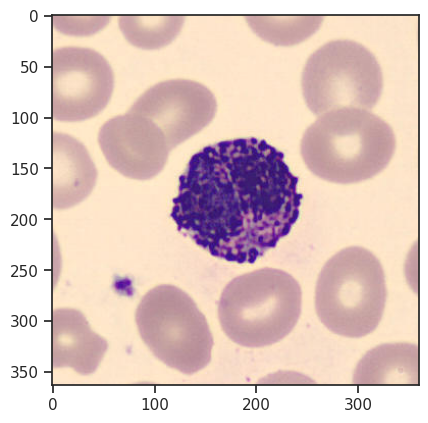

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
Prediksi untuk BA_2862 (3).jpg: basophil


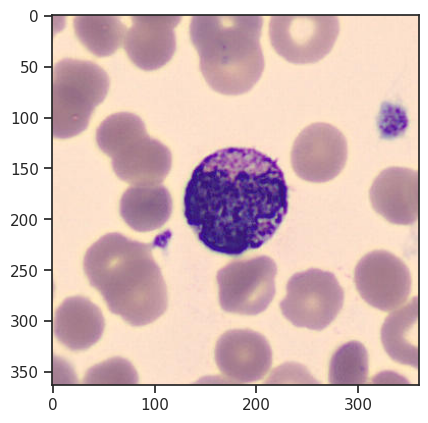

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Prediksi untuk BA_15551 (1).jpg: basophil


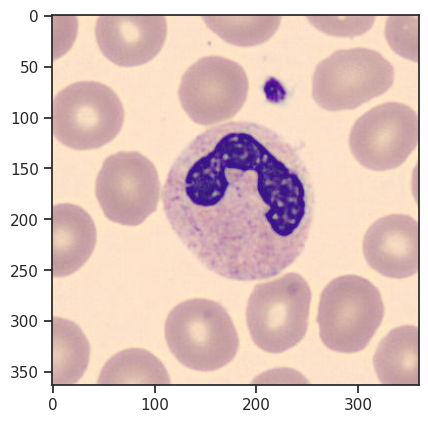

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Prediksi untuk BNE_34065 (1).jpg: neutrophil


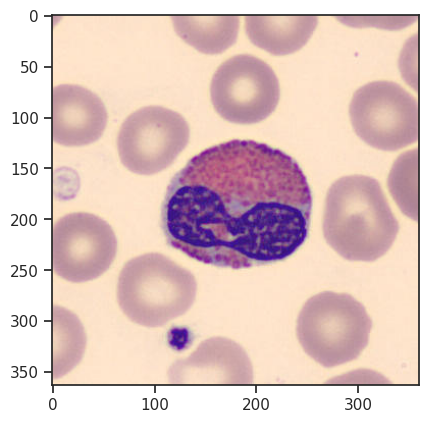

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Prediksi untuk EO_8200 (4).jpg: eosinophil


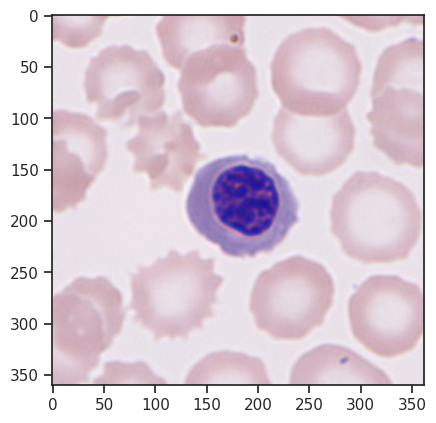

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Prediksi untuk ERB_8550 (4).jpg: erythroblast


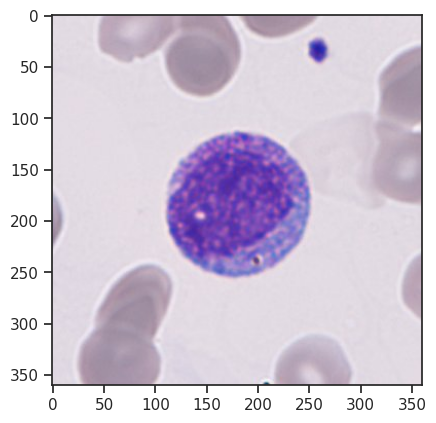

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Prediksi untuk IG_110946 (4).jpg: ig


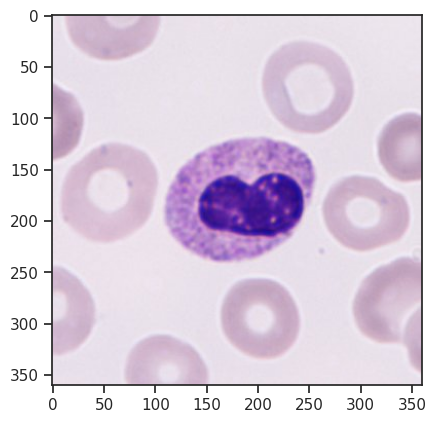

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Prediksi untuk IG_236829 (1).jpg: ig


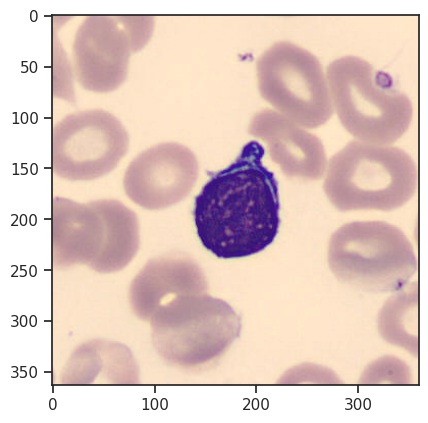

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Prediksi untuk LY_13652 (1).jpg: lymphocyte


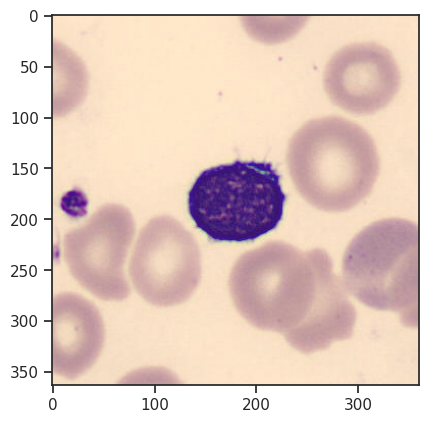

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Prediksi untuk LY_29236 (4).jpg: lymphocyte


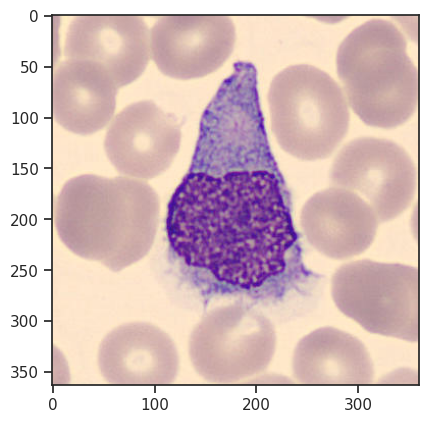

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Prediksi untuk MO_12267 (4).jpg: monocyte


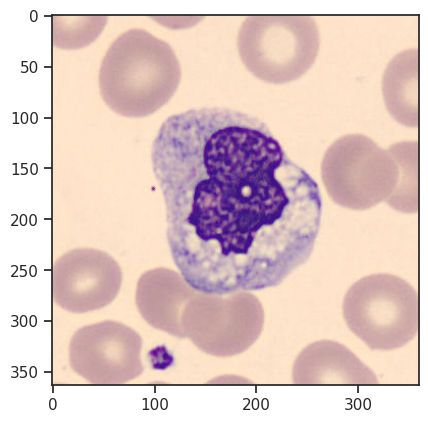

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Prediksi untuk MO_26771 (2).jpg: erythroblast


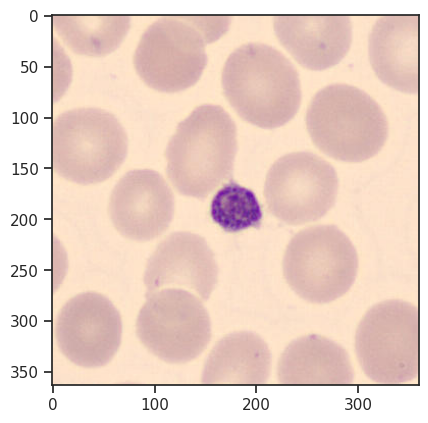

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Prediksi untuk PLATELET_2726 (4).jpg: platelet

Hasil prediksi semua gambar yang di-upload:
BA_2862 (3).jpg: basophil
BA_15551 (1).jpg: basophil
BNE_34065 (1).jpg: neutrophil
EO_8200 (4).jpg: eosinophil
ERB_8550 (4).jpg: erythroblast
IG_110946 (4).jpg: ig
IG_236829 (1).jpg: ig
LY_13652 (1).jpg: lymphocyte
LY_29236 (4).jpg: lymphocyte
MO_12267 (4).jpg: monocyte
MO_26771 (2).jpg: erythroblast
PLATELET_2726 (4).jpg: platelet


In [54]:
# Install TensorFlow jika belum terpasang
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Muat model
model = load_model('/content/model_2_cnn.h5')

# Tentukan ukuran gambar
IMG_HEIGHT = 224
IMG_WIDTH = 224

# List untuk menyimpan hasil prediksi sebelumnya
predictions = []

# Fungsi untuk memproses dan memprediksi gambar
def predict_image(img_path):
    img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    prediction = model.predict(img_array)

    # Mengambil kelas dengan probabilitas tertinggi
    predicted_class = np.argmax(prediction, axis=1)
    return predicted_class

# Upload gambar untuk diuji
from google.colab import files
uploaded = files.upload()

# Gambar yang di-upload dan prediksi baru
for file_name in uploaded.keys():
    img_path = '/content/' + file_name
    # Tampilkan gambar
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.show()

    # Prediksi gambar
    predicted_class = predict_image(img_path)

    # Menambahkan prediksi ke list
    predictions.append((file_name, class_names[predicted_class[0]]))

    # Tampilkan prediksi yang telah dilakukan
    print(f"Prediksi untuk {file_name}: {class_names[predicted_class[0]]}")

# Tampilkan semua prediksi yang telah dilakukan
print("\nHasil prediksi semua gambar yang di-upload:")
for img_name, pred_class in predictions:
    print(f"{img_name}: {pred_class}")

### **Kesimpulan**

Dari hasil interface ini dengan model 2 didapati bahwa model dapat melakukan prediksi pada data baru dengan baik dimana saya menguji dengan 12 data dan semuanya berhasil di prediksi dengan benar alias 100%.

## **Kesimpulan**

**Model 1** menunjukkan hasil yang baik dalam mengklasifikasikan data gambar ke dalam 8 kelas yang berbeda.

- **Akurasi Model:**
  - Akurasi pada data training: 0.89
  - Akurasi pada data testing: 0.88

- **Overfitting:** Model ini tidak mengalami overfitting, karena perbedaan akurasi antara data training dan testing tidak terlalu signifikan.

- **Kinerja Kelas:**
  - Kelas 7 menunjukkan performa sangat baik, dengan precision dan recall mendekati 1.00, yang menandakan bahwa model sangat akurat dalam memprediksi kelas ini.
  - Kelas lainnya juga memiliki performa yang baik, meskipun ada sedikit penurunan pada kelas 5, yang menunjukkan recall lebih rendah dibandingkan dengan kelas lainnya.

Kesimpulan Model ini bekerja dengan sangat baik untuk sebagian besar kelas, dengan sedikit penurunan di beberapa kelas (terutama kelas 3 dan kelas 5), namun secara keseluruhan, model ini cukup andal dengan akurasi 88%, yang menunjukkan kemampuan model untuk memprediksi data dengan cukup tepat.

**Model 2** menunjukkan hasil yang sangat baik dalam mengklasifikasikan data gambar ke dalam 8 kelas yang berbeda.

- **Akurasi Model:**
  - Akurasi pada data training: 0.95
  - Akurasi pada data testing: 0.95

- **Overfitting:** Model ini tidak mengalami overfitting, karena tidak ada perbedaan akurasi antara data training dan testing.

- **Kinerja Kelas:**
  - Kelas 7 menunjukkan performa luar biasa, dengan precision dan recall yang mendekati 1.00, yang menunjukkan bahwa model sangat akurat dalam memprediksi kelas ini.
  - Kelas lainnya juga menunjukkan performa yang sangat baik, dengan sebagian besar kelas memiliki precision dan recall yang tinggi (di atas 0.90), khususnya kelas 1, 6, dan 7 yang hampir sempurna.
  - Kelas 5 memiliki sedikit penurunan pada recall (0.87), namun masih tetap berada dalam performa yang dapat diterima.

Kesimpulan Model ini bekerja dengan sangat baik pada sebagian besar kelas, dengan akurasi keseluruhan 95%. Hal ini menunjukkan bahwa model mampu memprediksi dengan sangat tepat pada data yang diberikan, dengan sedikit penurunan pada kelas 5.

In [55]:
!pip freeze > requirements.txt